In [7]:
import json
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import textwrap

In [3]:
with open ('../logs/test/test-qwen3-8b.json') as f:
    logs = json.load(f)

print(len(logs))

85


In [4]:
for log in logs[:-5]:
    print(log)

{'reasoning': "Okay, let's see. The game is just starting, Turn 0, and it's RED's turn. Both players have zero victory points and no resources. The robber is on node (1,1,-2), but I need to check if that's a node or a tile. Wait, the robber position is given as (1,1,-2), but the nodes are numbered 0-53. Maybe that's a tile coordinate? The tiles are identified by cube coordinates (x,y,z) where x+y+z=0. The robber is on a tile, but the exact position might affect where roads or settlements can be built. However, since there are no roads built yet, maybe the robber's position isn't immediately impactful unless someone builds near it.\n\nThe main thing here is that both players are starting from scratch. The first move is crucial for establishing a strong position. Since there are no roads or settlements, the best strategy is to place the first settlement in a location that maximizes resource access and potential for future development. \n\nLooking at the available nodes, all are empty. Th

/tmp/ipykernel_499689/2742598311.py:41: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


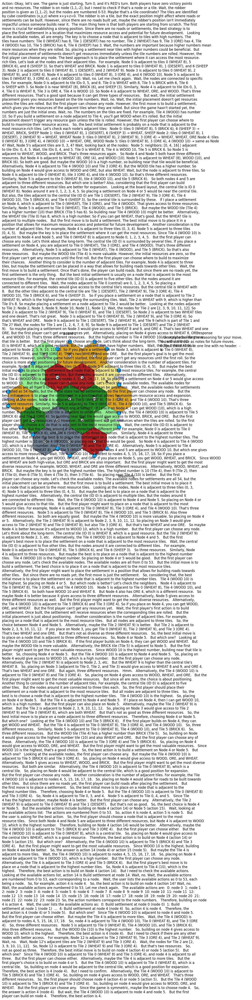

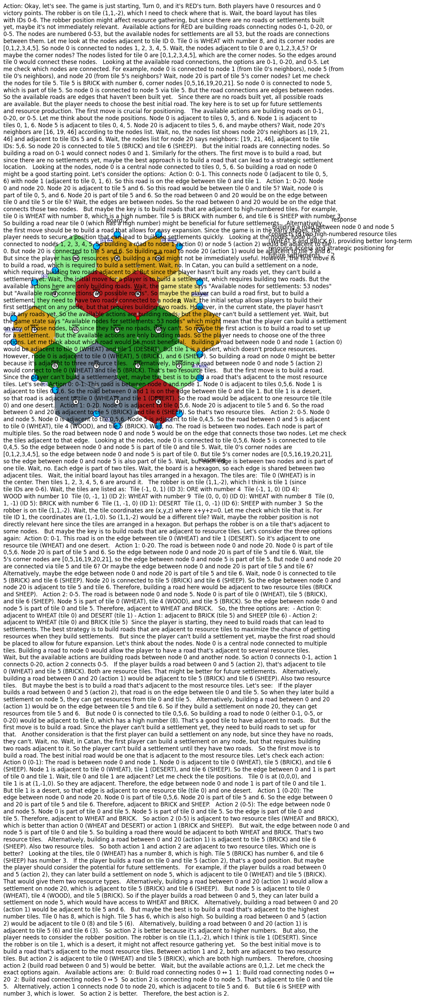

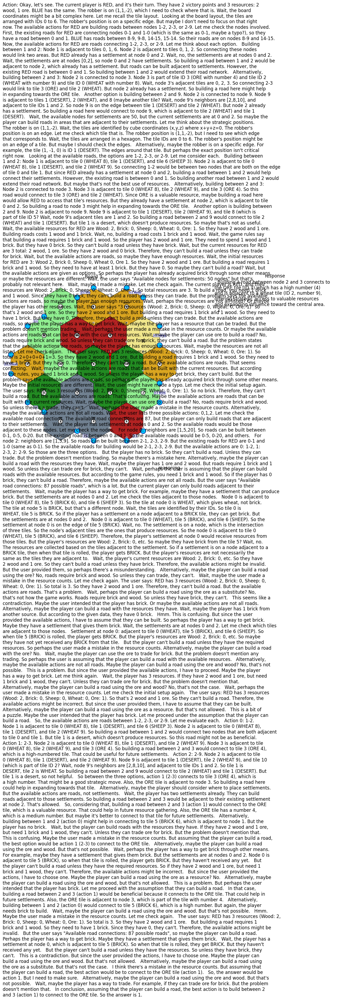

/tmp/ipykernel_499689/2742598311.py:41: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


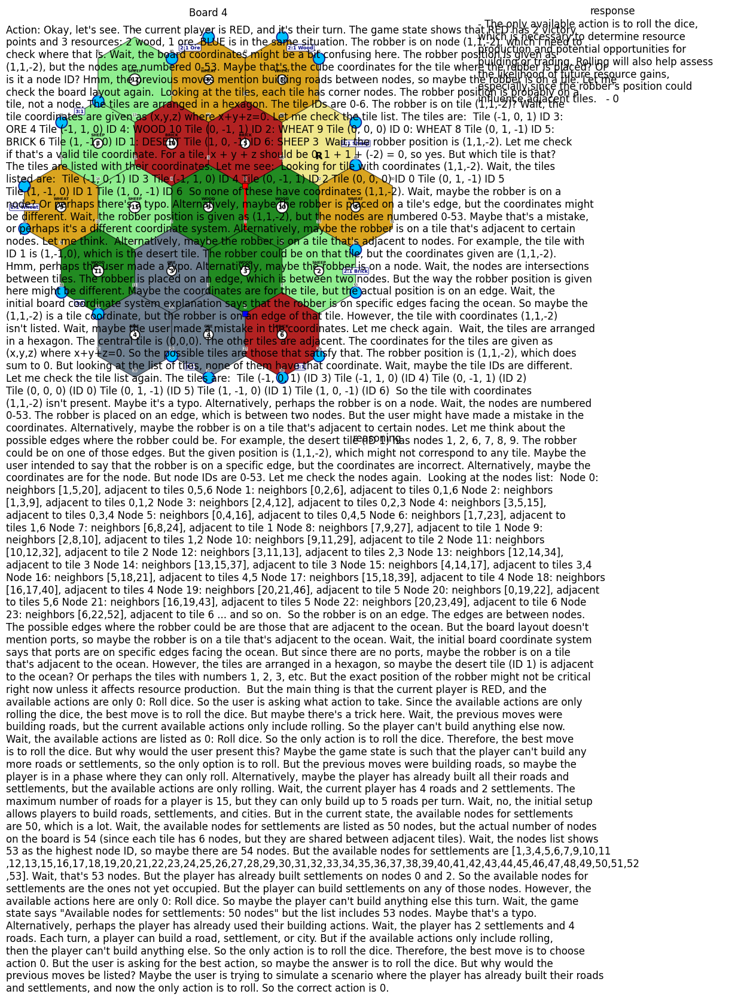

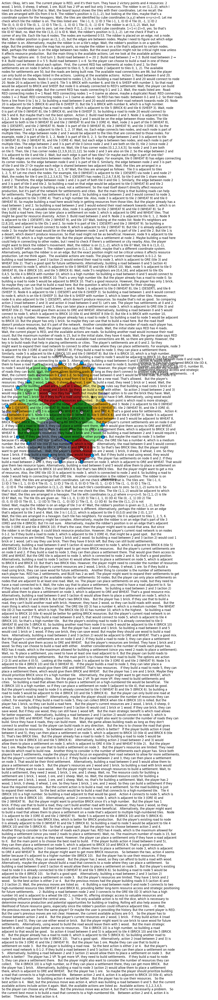

In [10]:
for i in range(5):
    log = logs[i]
    reasoning = log['reasoning']
    response = log['response']
    
    # Open the board image
    try:
        board = Image.open(f'../boards/test/test-{i + 1}.png')
    except FileNotFoundError:
        print(f"Image not found for board {i+1}. Skipping.")
        continue

    # Create a figure and a grid specification
    fig = plt.figure(figsize=(16, 12))
    # You can adjust width_ratios and height_ratios to change the relative sizes
    gs = GridSpec(2, 2, figure=fig, width_ratios=[3, 2], height_ratios=[3, 1])

    # Plot board image
    ax_img = fig.add_subplot(gs[0, 0])
    ax_img.imshow(board)
    ax_img.axis('off')
    ax_img.set_title(f'Board {i+1}')

    # Plot response text
    ax_response = fig.add_subplot(gs[0, 1])
    # Wrap the text to fit within the subplot
    wrapped_response = textwrap.fill(response, width=50) # Adjust width as needed
    ax_response.text(0, 1, wrapped_response, ha='left', va='top', fontsize=12, wrap=True)
    ax_response.axis('off')
    ax_response.set_title('response')

    # Plot reasoning text
    ax_reasoning = fig.add_subplot(gs[1, :]) # Spans both columns
    # Wrap the text to fit within the subplot
    wrapped_reasoning = textwrap.fill(f"Action: {reasoning}", width=120) # Adjust width as needed
    ax_reasoning.text(0, 0.5, wrapped_reasoning, ha='left', va='center', fontsize=12, wrap=True)
    ax_reasoning.axis('off')
    ax_reasoning.set_title('reasoning')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()